rargmax

In [2]:
import numpy as np
import random as pr
import gymnasium as gym

# 환경 설정
env = gym.make("FrozenLake-v1", is_slippery=False)

# Q 테이블 초기화(상태 x 행동)
Q = np.zeros((env.observation_space.n, env.action_space.n))

num_episodes = 2000
rewards_per_episode = []

# 에피소드 반복
for episode in range(num_episodes):
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Q값이 가장 큰 행동 선택
        action = np.argmax(Q[state])

        # 행동 수행 및 결과 관찰
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # 종료 조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + np.max(Q[next_state])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward

    rewards_per_episode.append(total_reward)

# 결과 출력
print(f"\n마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
print("최종 Q 테이블 :")
print(Q)



마지막 100 에피소드 평균 보상 : 0.0000
최종 Q 테이블 :
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


In [3]:
import numpy as np
import random as pr
import gymnasium as gym


# Q값이 동일한 경우 무작위로 최대값 인덱스를 선택하는 함수
def rargmax(vector):
    """Argmax that chooses randomly among eligible maximum indices."""
    m = np.amax(vector)  # 벡터에서 최대값 구하기
    indices = np.nonzero(vector == m)[0]  # 최대값을 가지는 인덱스 모두 찾기
    return pr.choice(indices)  # 그 중 하나 무작위 선택


# 환경 설정
env = gym.make("FrozenLake-v1", is_slippery=False)

# Q 테이블 초기화(상태 x 행동)
Q = np.zeros((env.observation_space.n, env.action_space.n))

num_episodes = 2000
rewards_per_episode = []


# 에피소드 반복
for episode in range(num_episodes):
    print(episode)  # 에피소드 출력 추가
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Q값이 가장 큰 행동 선택
        # action = np.argmax(Q[state])
        action = rargmax(Q[state])

        # 행동 수행 및 결과 관찰
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # 종료 조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + np.max(Q[next_state])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward

    rewards_per_episode.append(total_reward)
    print(rewards_per_episode)  # 출력

# 결과 출력
print(f"\n마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
print("최종 Q 테이블 :")
print(Q)


0
[0.0]
1
[0.0, 0.0]
2
[0.0, 0.0, 0.0]
3
[0.0, 0.0, 0.0, 0.0]
4
[0.0, 0.0, 0.0, 0.0, 0.0]
5
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
6
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
7
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
8
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
9
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
10
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
11
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
12
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
13
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
14
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
15
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
16
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
17
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
18
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,

Initial state :
S F F F
F H F H
F F F H
H F F P

Success rate : 0.922
Final Q-Table Values
LEFT DOWN RIGHT UP
[[0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 0. 0. 0.]]


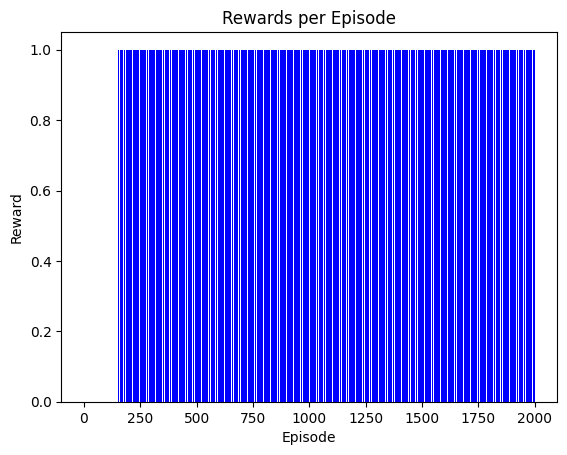

In [4]:
import numpy as np
import random as pr
import gymnasium as gym
import matplotlib.pyplot as plt # 성공여부 그래프를 위한 모듈 추가


# Q값이 동일한 경우 무작위로 최대값 인덱스를 선택하는 함수
def rargmax(vector):
    """Argmax that chooses randomly among eligible maximum indices."""
    m = np.amax(vector)  # 벡터에서 최대값 구하기
    indices = np.nonzero(vector == m)[0]  # 최대값을 가지는 인덱스 모두 찾기
    return pr.choice(indices)  # 그 중 하나 무작위 선택

def print_state(state):
    state_desc = env.unwrapped.desc.tolist()
    state_desc = [[c.decode('utf-8') for c in line] for line in state_desc]
    row, col = divmod(state, 4)
    state_desc[row][col] = 'P' # 현재 위치(플레이어)
    
    for line in state_desc:
        print(" ".join(line))
    print()

print("Initial state :")
print_state(state)


# 환경 설정
env = gym.make("FrozenLake-v1", is_slippery=False)

# Q 테이블 초기화(상태 x 행동)
Q = np.zeros((env.observation_space.n, env.action_space.n))

num_episodes = 2000
rewards_per_episode = []


# 각 에피소드에서 받은 총 보상 저장 리스트
rList = []

# 에피소드 반복
for episode in range(num_episodes):
    # print(episode)  # 에피소드 출력 추가
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # Q값이 가장 큰 행동 선택
        # action = np.argmax(Q[state])
        action = rargmax(Q[state])

        # 행동 수행 및 결과 관찰
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # 종료 조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + np.max(Q[next_state])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward

    # rewards_per_episode.append(total_reward)
    # print(rewards_per_episode)  # 출력
    rList.append(total_reward)

# 결과 출력
# print(f"\n마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
# print("최종 Q 테이블 :")
# print(Q)
print(f"Success rate : {str(sum(rList)/num_episodes)}")
print("Final Q-Table Values")
print("LEFT DOWN RIGHT UP")
print(Q)

# 시각화 : 에피소드별 보상 히스토 그램
plt.bar(range(len(rList)), rList, color='blue')
plt.title("Rewards per Episode")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.show()

Pseudocode에서 argmax는 **어떤 함수나 표현식의 값을 최대화하는 입력 값(argment)**을 의미합니다.
- 어떤 함수나 리스트 등의 최대값을 갖는 인덱스나 요소를 구할 때 사용.
- argmax vs max
- - argmax(f(x)) : 함수 f(x)가 최대값을 갖는 x의값 = 인자 (x 값)
- - max(f(x)) : 함수 f(x)의 최대값 = 값

argmax vs rargmax

argmax :
- 최댓값을 갖는 첫 번째 인덱스 반환
- 다수의 최대값 존재 시 항상 가장 먼저 등장하는 인덱스 반환

rargmax :
- 최댓값을 갖는 인덱스 중 무작위로 선택
- 다수의 최대값 존재 시 매번 다른 인덱스 반환

[[0. 0. 1. 0.] # 오른쪽 
 [0. 0. 1. 0.] # 오른쪽
 [0. 1. 0. 0.] # 아래
 [0. 0. 0. 0.] # 막다른 길/아래는 구멍/갈피 못 잡음
 [0. 0. 0. 0.] # 갈피 못 잡음
 [0. 0. 0. 0.] # 구멍
 [0. 1. 0. 0.] # 아래
 [0. 0. 0. 0.] # 구멍
 [0. 0. 0. 0.] # 갈피 못 잡음
 [0. 0. 0. 0.] # 갈피 못 잡음
 [0. 1. 0. 0.] # 아래
 [0. 0. 0. 0.] # 구멍
 [0. 0. 0. 0.] # 구멍
 [0. 0. 1. 0.] # 오른쪽 /근데 갑자기 10번에서 아래로 잘 가다 13번에 한번 들름
 [0. 0. 1. 0.] # 오른쪽
 [0. 0. 0. 0.]] # 도착 Q값 업데이트 x

결론: 13번에 들른 이유
요인	            설명
보상 역전파	: 15에서 시작된 보상이 14 → 13으로 전파됨
초기 탐색 랜덤성 : rargmax()로 인해 13번 경로가 우연히 강화됨
학습률 1, 할인률 1 : Q값이 빠르게 뒤로 확산되며 우회 경로가 강화됨
탐욕 정책 : 이후에는 그 강화된 경로만 계속 따르게 됨

e-greedy

Initial state :
S F F F
F H F H
F F F H
H F F P

Success rate : 0.9685
Final Q-Table Values
LEFT DOWN RIGHT UP
[[0.         0.         0.95099005 0.        ]
 [0.         0.         0.96059601 0.        ]
 [0.         0.970299   0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.9801     0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.970299   0.        ]
 [0.         0.         0.9801     0.        ]
 [0.         0.99       0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         0.         0.        ]
 [0.         0.         1.         0.        ]
 [0.         0.         0.         0.        ]]


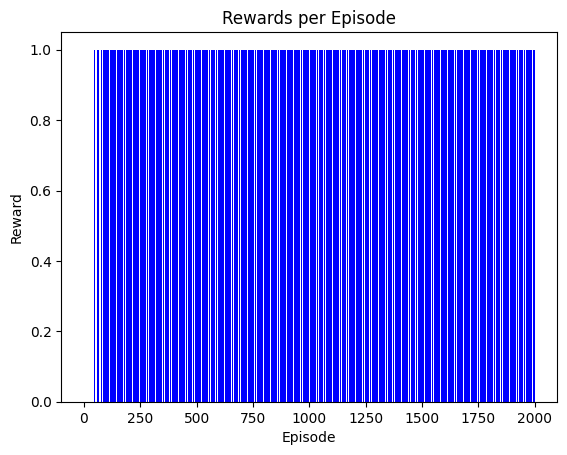

In [5]:
import numpy as np
import random as pr
import gymnasium as gym
import matplotlib.pyplot as plt # 성공여부 그래프를 위한 모듈 추가


# Q값이 동일한 경우 무작위로 최대값 인덱스를 선택하는 함수
def rargmax(vector):
    """Argmax that chooses randomly among eligible maximum indices."""
    m = np.amax(vector)  # 벡터에서 최대값 구하기
    indices = np.nonzero(vector == m)[0]  # 최대값을 가지는 인덱스 모두 찾기
    return pr.choice(indices)  # 그 중 하나 무작위 선택

def print_state(state):
    state_desc = env.unwrapped.desc.tolist()
    state_desc = [[c.decode('utf-8') for c in line] for line in state_desc]
    row, col = divmod(state, 4)
    state_desc[row][col] = 'P' # 현재 위치(플레이어)
    
    for line in state_desc:
        print(" ".join(line))
    print()

print("Initial state :")
print_state(state)


# 환경 설정
env = gym.make("FrozenLake-v1", is_slippery=False)

# Q 테이블 초기화(상태 x 행동)
Q = np.zeros((env.observation_space.n, env.action_space.n))

rewards_per_episode = []

# Discount factor
dis = .99
num_episodes = 2000

# 각 에피소드에서 받은 총 보상 저장 리스트
rList = []

# 에피소드 반복
for i in range(num_episodes):
    # e = 1. / ((i/100)+1) # epsilon 값 감소 (탐험 비율 줄이기)
    state, _ = env.reset()
    done = False
    total_reward = 0

    while not done:
        # e-greedy 방식으로 행동 선택 (기본형)
        # if np.random.rand(1) < e:
        #     action = env.action_space.sample() # 탐험 (랜덤 선택)
        # else:
        #     action = np.argmax(Q[state, :]) # 이용 (가장 높은 Q값 선택)
            
        # 반복 학습 중 탐험을 위한 노이즈 추가 방식 (개선된 e-greedy 방식)
        action = np.argmax(Q[state, :] + np.random.randn(1, env.action_space.n)/(i+1))

        # 행동 수행 및 결과 관찰
        next_state, reward, terminated, truncated, info = env.step(action)
        done = terminated or truncated  # 종료 조건

        # Q 테이블 업데이트 (a=1, y=1 가정)
        Q[state, action] = reward + dis * np.max(Q[next_state, :])

        # 다음 상태로 이동
        state = next_state
        total_reward += reward

    # rewards_per_episode.append(total_reward)
    # print(rewards_per_episode)  # 출력
    rList.append(total_reward)

# 결과 출력
# print(f"\n마지막 100 에피소드 평균 보상 : {np.mean(rewards_per_episode[-100:]):.4f}")
# print("최종 Q 테이블 :")
# print(Q)
print(f"Success rate : {str(sum(rList)/num_episodes)}")
print("Final Q-Table Values")
print("LEFT DOWN RIGHT UP")
print(Q)

# 시각화 : 에피소드별 보상 히스토 그램
plt.bar(range(len(rList)), rList, color='blue')
plt.title("Rewards per Episode")
plt.xlabel("Episode")
plt.ylabel("Reward")
plt.show()

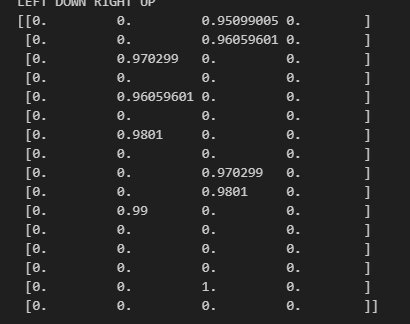

여기서 앞의 6단계는 제대로 갔고 뒤에 오른쪽 2번은 과잉 이동?

dis = 0.99는 Q-learning에서의 할인율로, 미래 보상을 현재에 얼마나 반영할지 결정합니다.

- 값이 1에 가까울수록 미래 보상을 크게 반영 → 장기적인 최적 경로 학습에 유리
- 값이 0에 가까울수록 현재 보상에만 집중 → 빠른 보상 선호, 긴 경로 학습 어려움

FrozenLake처럼 도착점에서만 보상을 받는 환경에서는 dis를 0.9~1.0 사이로 설정하는 것이 일반적입니다.


is_slippery=True

In [6]:
import gymnasium as gym

# 환경 생성
env = gym.make("FrozenLake-v1", map_name="4x4", is_slippery=True, render_mode="ansi")

# 초기화
state, info = env.reset()

# MACROS: 방향 정의
LEFT = 0
DOWN = 1
RIGHT = 2
UP = 3

# 키보드 입력 매핑
arrow_keys = {
    'w' : UP,
    's' : DOWN,
    'd' : RIGHT,
    'a' : LEFT
}

# 상태 출력 함수 (4x4 grid)
def print_state(state):
    state_desc = env.unwrapped.desc.tolist()
    state_desc = [[c.decode('utf-8') for c in line] for line in state_desc]
    row, col = divmod(state, 4)
    state_desc[row][col] = 'P' # 현재 위치(플레이어)
    
    for line in state_desc:
        print(" ".join(line))
    print()
    
print("Use 'w', 'a', 's', 'd' keys to move the agent.")
print("Press 'q' to quit the game.\n")

print("Initial state :")
print_state(state)


while True:
    key = input("Enter action (w/a/s/d): ").strip().lower()
    if key == 'q':
        print("Game aborted.")
        break
    
    if key not in arrow_keys:
        print("Invalid key. Use 'w', 'a', 's', 'd'.")
        continue
    
    action = arrow_keys[key]
    next_state, reward, terminated, truncated, info = env.step(action)
    
    # 결과 출력
    action_names = {UP:"UP", DOWN:"DOWN", LEFT:"LEFT", RIGHT:"RIGHT"}
    print(f"\nAction: {action_names[action]}, State: {next_state}, Reward: {reward}, Info: {info}")
    
    print("Current state:")
    print_state(next_state)
    
    state = next_state
    
    if terminated or truncated:
        if reward == 1.0:
            print("Congratulations! You reached the goal!")
        else:
            print("Game over. You fell into a hole.")
        break
    
print("Game ended.")

Use 'w', 'a', 's', 'd' keys to move the agent.
Press 'q' to quit the game.

Initial state :
P F F F
F H F H
F F F H
H F F G

Game aborted.
Game ended.


Initial state :
S F F F
F H F H
F F F H
H F F G

Success rate: 0.000
Final Q-Table Values
LEFT DOWN RIGHT UP
[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


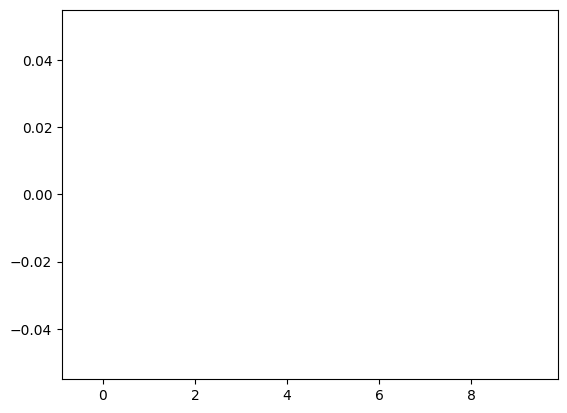

In [ ]:
import numpy as np
import gymnasium as gym
import matplotlib.pyplot as plt
import random as pr

def rargmax(vector):
    """최대 Q값 중 무작위 인덱스 선택"""
    m = np.amax(vector)
    indices = np.nonzero(vector==m)[0]
    return pr.choice(indices)

def print_state(state):
    state_desc = env.unwrapped.desc.tolist()
    state_desc = [[c.decode('utf-8') for c in line] for line in state_desc]
    row, col = divmod(state, 4)
    # state_desc[row][col] = 'P' # 현재 위치(플레이어)
    
    for line in state_desc:
        print(" ".join(line))
    print()

print("Initial state :")
print_state(state)

# 환경 생성
env = gym.make("FrozenLake-v1", map_name="4x4", is_slippery=True, render_mode="human")

# Q테이블 초기화
Q = np.zeros([env.observation_space.n, env.action_space.n])

# 할인율 및 학습률 설정
dis = 0.99
# num_episodes 
# = 2000
num_episodes=10
learning_rate = 0.75

# 보상 리스트 초기화
rList = []

for i in range(num_episodes):
    # 환경 리셋
    state, _ = env.reset()
    rAll = 0
    done = False
    # Q-Table 학습
    while not done:
        env.render()
        # 노이즈 추가한 Q값으로 행동 선택
        action = np.argmax(Q[state, :] + np.random.randn(1, env.action_space.n) / (i + 1))
        # 환경에서 다음 상태 및 보상 가져오기
        new_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated
        
        # Q-값 업데이트
        Q[state,action]=(1-learning_rate)*Q[state,action]+learning_rate*(reward+dis*np.max(Q[new_state,:]))
        rAll += reward
        state = new_state
        
    rList.append(rAll)
    
# 결과 출력 (소수점 3자리로 제한)
print("Success rate: {:.3f}".format(sum(rList) / num_episodes))
print("Final Q-Table Values")
print("LEFT DOWN RIGHT UP")
print(np.round(Q, 3))
plt.bar(range(len(rList)), rList, color="blue")
plt.show()
env.close()

# render_mode = "human" 테스트해봄

In [ ]:
import numpy as np
import gymnasium as gym
import matplotlib.pyplot as plt
import random as pr

def rargmax(vector):
    m = np.amax(vector)
    indices = np.nonzero(vector == m)[0]
    return pr.choice(indices)

# 하이퍼파라미터 후보들
dis_list = [0.8, 0.9, 0.95, 0.99, 1.0]              # 할인율 gamma → dis로 사용
learning_rate_list = [0.1, 0.3, 0.5, 0.7, 0.9]      # 학습률 alpha → learning_rate로 사용
num_episodes = 2000

# 결과 저장
results = []

for dis in dis_list:
    for learning_rate in learning_rate_list:
        env = gym.make("FrozenLake-v1", map_name="4x4", is_slippery=True)
        Q = np.zeros([env.observation_space.n, env.action_space.n])
        rList = []

        for i in range(num_episodes):
            state, _ = env.reset()
            rAll = 0
            done = False

            while not done:
                action = np.argmax(Q[state, :] + np.random.randn(1, env.action_space.n) / (i + 1))
                new_state, reward, terminated, truncated, _ = env.step(action)
                done = terminated or truncated
                Q[state, action] = (1 - learning_rate) * Q[state, action] + learning_rate * (reward + dis * np.max(Q[new_state, :]))
                rAll += reward
                state = new_state

            rList.append(rAll)

        success_rate = sum(rList) / num_episodes
        results.append((dis, learning_rate, success_rate))
        print(f"dis={dis}, learning_rate={learning_rate} → Success rate: {success_rate:.4f}")

# 최적 조합 출력
best = max(results, key=lambda x: x[2])
print(f"\n✅ Best combination: dis={best[0]}, learning_rate={best[1]} → Success rate: {best[2]:.4f}")


dis=0.8, learning_rate=0.1 → Success rate: 0.0680
dis=0.8, learning_rate=0.3 → Success rate: 0.1245
dis=0.8, learning_rate=0.5 → Success rate: 0.1885
dis=0.8, learning_rate=0.7 → Success rate: 0.1850
dis=0.8, learning_rate=0.9 → Success rate: 0.0765
dis=0.9, learning_rate=0.1 → Success rate: 0.0790
dis=0.9, learning_rate=0.3 → Success rate: 0.1010
dis=0.9, learning_rate=0.5 → Success rate: 0.4450
dis=0.9, learning_rate=0.7 → Success rate: 0.5910
dis=0.9, learning_rate=0.9 → Success rate: 0.2915
dis=0.95, learning_rate=0.1 → Success rate: 0.1760
dis=0.95, learning_rate=0.3 → Success rate: 0.2150
dis=0.95, learning_rate=0.5 → Success rate: 0.5315
dis=0.95, learning_rate=0.7 → Success rate: 0.6435
dis=0.95, learning_rate=0.9 → Success rate: 0.4935
dis=0.99, learning_rate=0.1 → Success rate: 0.0840
dis=0.99, learning_rate=0.3 → Success rate: 0.1105
dis=0.99, learning_rate=0.5 → Success rate: 0.1955
dis=0.99, learning_rate=0.7 → Success rate: 0.6040
dis=0.99, learning_rate=0.9 → Success rat

강화 학습과 Qlearning

강화학습 (Reinforcement Learning, RL)

- 에이전트(Agent)가 환경(Environment)과 상호작용하며 학습하는 머신러닝의 한 분야.
- 매 시간마다 상태(State)를 관찰하고, 행동(Action)을 선택하며, 보상(Reward)을 받는다.
- 목표는 누적 보상(total reward)을 최대화하는 최적의 정책(Policy)을 학습하는 것.

구성 요소
- 상태 (S): 현재 환경의 정보
- 행동 (A): 에이전트가 취할 수 있는 선택
- 보상 (R): 행동의 결과로 받는 수치
- 정책 (π): 상태 → 행동 매핑
- 가치 함수 (V, Q): 특정 상태/행동의 장기적 보상 기대값

학습 방식
- 탐험(Exploration): 새로운 행동을 시도
- 이용(Exploitation): 현재까지 학습한 최선의 행동 선택

---

Q-Learning

- 대표적인 오프폴리시(Off-policy) 값 기반 강화학습 알고리즘
- Q 테이블(Q[s,a])을 학습하여, 상태 s에서 행동 a의 가치를 추정
- 최적 정책은 Q값이 가장 큰 행동을 선택하는 방식으로 도출

Q-learning 업데이트 공식:
Q(s,a) ← Q(s,a) + α * [r + γ * max(Q(s’, a’)) - Q(s,a)]

- α (학습률): 새 정보 반영 정도 (0~1)
- γ (할인율): 미래 보상의 중요도 (0~1)
- r: 현재 시점에서 받은 보상
- s’: 다음 상태, a’: 다음 가능한 행동

특징
- 환경 모델 없이 학습 가능 (model-free)
- ε-greedy 또는 노이즈 기반 방식으로 탐험 수행 가능
- 간단하지만 불안정한 환경에선 튜닝이 중요 (α, γ, ε 등)

목표
- 모든 상태-행동 쌍에 대해 Q값을 학습하여, 가장 높은 보상을 주는 행동을 선택하는 최적 정책을 찾는 것
